# Hierarchical Refinement for Large-Scale Optimal Transport

## Introduction

This tutorial explores the method proposed in the paper **"Hierarchical Refinement: Optimal Transport to Infinity and Beyond"** by Peter Halmos, Julian Gold, Xinhao Liu, and Benjamin J. Raphael. The paper introduces **HiRef**, a recursive and hierarchical algorithm which scales optimal transport linearly in space and log-linearly in time by using a multiscale strategy that constructs coarse-to-fine partitions via low-rank optimal transport.

Traditional optimal transport (OT) methods often struggle with scalability and may fail to capture intricate multi-scale structures within complex distributions. HiRef addresses this by refining transport plans across successive resolutions, starting from coarse partitions and progressively “zooming in” to finer levels guided by the data geometry.

In this notebook, we:
- Introduce the key ideas behind HiRef and low-rank Sinkhorn algorithms.  
- Implement HiRef using the `OTT-JAX` library.  
- Reproduce selected experiments from the paper (e.g., Figure 3a and 3b), illustrating HiRef’s ability to align geometrically complex datasets such as half-moons/S-curves and checkerboards.

This tutorial assumes basic familiarity with optimal transport concepts and builds upon recent computational OT advances.

<img src="https://chatdoc-arxiv.oss-us-west-1.aliyuncs.com/images/arxiv/2503.03025/first_image.jpeg?AWSAccessKeyId=LTAI5t6b2G8eTtEBczAMwjhc&Signature=VbDIQ66V9GDgAlrpp7grv%2B8VFjg%3D&Expires=9223372038600552448" width="800"/>

(image taken from the original article, Figure 1)

## Packages

In [1]:
import numpy as np
import jax.numpy as jnp

from ott.geometry import pointcloud
from ott.solvers.linear.sinkhorn_lr import LRSinkhorn
from ott.problems.linear.linear_problem import LinearProblem

from sklearn.datasets import make_moons, make_s_curve

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## Plot function in 3D

We provide three visualization utilities in this notebook:

- `plot_transport_3d`: renders the final Monge map as arrows between source and target points in 3D.  
- `plot_partitions_over_steps_3d`: shows each hierarchical partition side by side to illustrate the coarse-to-fine clustering.  
- `animate_transport_rotation`: renders the final Monge map with an animation that dynamically demonstrates how HiRef refines the transport plan across levels.

In [2]:
def plot_transport_3d(src, tgt, mapping=None, figsize=(16,16),
                      src_color='C0', tgt_color='C1',
                      line_color='0.5', alpha=0.5):
    """Visualize a transport mapping between two point sets in 3D."""
    src = np.asarray(src)
    tgt = np.asarray(tgt)

    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')

    # scatter
    ax.scatter(src[:,0], src[:,1], src[:,2],
               c=src_color, s=20, label='Source', depthshade=True)
    ax.scatter(tgt[:,0], tgt[:,1], tgt[:,2],
               c=tgt_color, s=20, label='Target', depthshade=True)

    # connecting lines
    if mapping:
        for i,j in mapping.items():
            xs = [src[i,0], tgt[j,0]]
            ys = [src[i,1], tgt[j,1]]
            zs = [src[i,2], tgt[j,2]]
            ax.plot(xs, ys, zs, color=line_color, alpha=alpha, linewidth=0.8)
    
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    
    ax.legend()
    ax.set_title('3D Transport Mapping')
    ax.view_init(elev=30, azim=25)
    plt.show()

def plot_partitions_over_steps_3d(X, Y, partitions,
                                  figsize_per_step=(4, 4),
                                  cmap_name='viridis',
                                  marker='o',
                                  ms=10,
                                  alpha=0.6,
                                  elev=20, azim=30):
    """3D visualization of HiRef partitions at each step (no legend, unified points)."""
    n_steps = len(partitions)
    fig = plt.figure(figsize=(figsize_per_step[0] * n_steps,
                              figsize_per_step[1]))
    cmap = mpl.colormaps[cmap_name]

    for t, clusters in enumerate(partitions):
        ax = fig.add_subplot(1, n_steps, t + 1, projection='3d')
        K = len(clusters)
        norms = np.arange(K) / max(K - 1, 1)

        for k, (src_idx, tgt_idx) in enumerate(clusters):
            color = cmap(norms[k])
            pts = np.vstack([X[src_idx], Y[tgt_idx]])
            ax.scatter(pts[:, 0], pts[:, 1], pts[:, 2],
                       c=[color], marker=marker,
                       s=ms, alpha=alpha)

        ax.set_title(f'Step {t + 1} ({K} clusters)', pad=8)
        ax.view_init(elev=elev, azim=azim)
        
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])
    plt.show()

def animate_transport_rotation(src, tgt, mapping=None,
                               elev=30, azim_start=0, azim_end=360,
                               frames=120, interval=100, figsize=(6,6)):
    """Animate a transport mapping between two point sets in 3D."""
    src = np.asarray(src)
    tgt = np.asarray(tgt)

    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')

    # Scatter
    ax.scatter(src[:,0], src[:,1], src[:,2], c='C0', s=20, depthshade=True)
    ax.scatter(tgt[:,0], tgt[:,1], tgt[:,2], c='C3', s=20, depthshade=True)

    # Mapping lines
    if mapping:
        for i, j in mapping.items():
            ax.plot([src[i,0], tgt[j,0]],
                    [src[i,1], tgt[j,1]],
                    [src[i,2], tgt[j,2]],
                    c='0.5', alpha=0.5, linewidth=0.8)

    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    def update(frame):
        az = azim_start + (azim_end - azim_start) * frame / (frames - 1)
        ax.view_init(elev=elev, azim=az)
        return fig,

    anim = FuncAnimation(fig, update, frames=frames, interval=interval, blit=False)
    plt.close(fig)
    return HTML(anim.to_jshtml())

## Double Moon to S-Curve Dataset 3D

We sample $N$ points from 2D half-moons and from the $X$–$Z$ projection of an S-curve via `make_moons` and `make_s_curve`, standardize each point cloud to zero mean and unit variance, then lift them onto two parallel planes at $z_{\text{src}}$ and $z_{\text{tgt}}$ in $\mathbb{R}^3$. Embedding in 3D highlights the multiscale refinement in our HiRef visualizations.

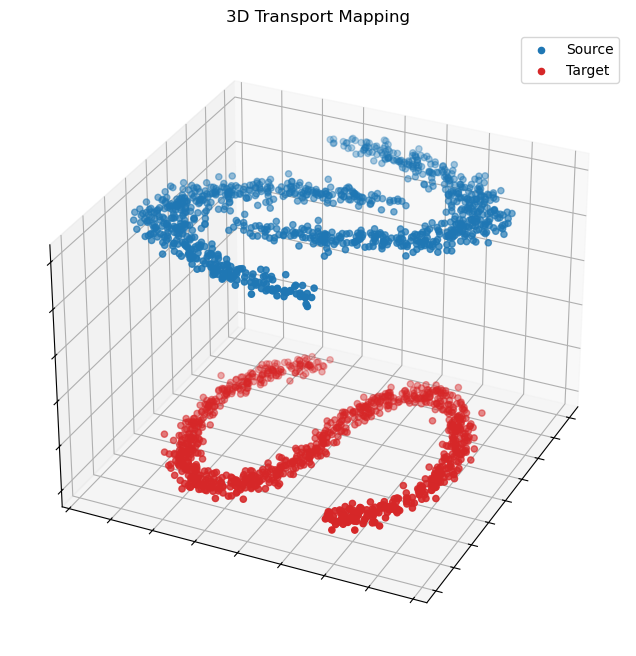

In [3]:
N = 1024  # Number of points in each dataset

def make_moons_scurve_3d(N, noise=0.1, random_state_src=0, random_state_tgt=1, z_src=1.0, z_tgt=0.0):
    """
    Generate two point‐clouds in R^3 on parallel planes:
      - Source: 2D half-moons (N pts).
      - Target: 2D projection of S-curve (N pts).
    Each cloud is centered & scaled to zero mean/unit variance, then lifted
    to z_src or z_tgt.
    """
    # Generate 2D clouds
    X2, _ = make_moons(n_samples=N, noise=noise, random_state=random_state_src)
    scurve, _ = make_s_curve(n_samples=N, noise=noise, random_state=random_state_tgt)
    Y2 = scurve[:, [0, 2]]  # take X,Z dims of the 3D S-curve

    # Standardize each
    X2 = (X2 - X2.mean(axis=0)) / X2.std(axis=0)
    Y2 = (Y2 - Y2.mean(axis=0)) / Y2.std(axis=0)

    # Embed into R^3
    X = np.hstack([X2, np.full((N,1), z_src)])
    Y = np.hstack([Y2, np.full((N,1), z_tgt)])

    return X, Y

X_moons_3d, Y_s_curve_3d = make_moons_scurve_3d(N, noise=0.1,
    random_state_src=0, random_state_tgt=1,
    z_src=1.0, z_tgt=0.0)

# Plot the datasets with plot_transport_3d
plot_transport_3d(X_moons_3d, Y_s_curve_3d, figsize=(8, 8), src_color='C0', tgt_color='C3')

## Checkerboard Dataset 3D

We generate two 3D checkerboard point clouds by sampling N points source cells on one z-plane and the target cells on a parallel z-plane, adding Gaussian noise and centering each cloud. Again, embedding in 3D (with $z_{\text{src}}=1$ and $z_{\text{tgt}}=0$) lets us clearly visualize the hierarchical refinement steps.

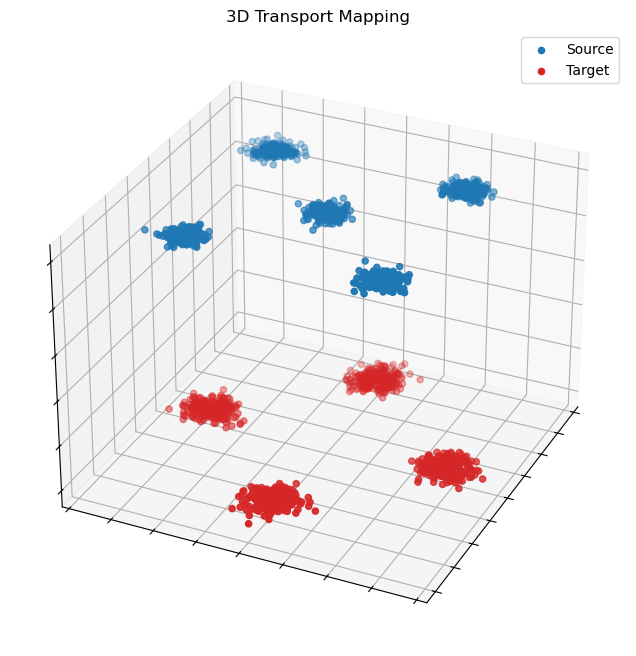

In [4]:
def make_checkerboard_3d(N, noise=0.05, z_src=1.0, z_tgt=0.0):
    """
    Generate two point‐clouds in R^3 on parallel planes:
      - Source has 5 checker‐cells (including the center cell 4).
      - Target has 4 checker‐cells (including the middle-right cell 5).
    Each cloud has exactly N points total.
    """
    # 3×3 grid cell centers in [0,1]×[0,1]
    grid = np.array([(i, j) for i in range(3) for j in range(3)]) / 2.0

    src_idx = [i for i,(r,c) in enumerate(grid*2) if (int(r)+int(c)) % 2 == 0]  # 0,2,4,6,8
    tgt_idx = [i for i,(r,c) in enumerate(grid*2) if (int(r)+int(c)) % 2 == 1]  # 1,3,5,7

    centers_src = grid[src_idx]
    centers_tgt = grid[tgt_idx]

    # How many pts per cluster so sums = N
    k_src = len(centers_src)
    k_tgt = len(centers_tgt)

    base_src, rem_src = divmod(N, k_src)
    sizes_src = [base_src + (1 if i < rem_src else 0) for i in range(k_src)]

    base_tgt, rem_tgt = divmod(N, k_tgt)
    sizes_tgt = [base_tgt + (1 if i < rem_tgt else 0) for i in range(k_tgt)]

    # Sample clusters in 2D
    src_clusters = [
        c + noise * np.random.randn(sizes_src[i], 2)
        for i, c in enumerate(centers_src)
    ]
    tgt_clusters = [
        c + noise * np.random.randn(sizes_tgt[i], 2)
        for i, c in enumerate(centers_tgt)
    ]

    X2 = np.vstack(src_clusters)  # shape (N,2)
    Y2 = np.vstack(tgt_clusters)  # shape (N,2)

    # Standardize each cloud
    X2 = (X2 - X2.mean(axis=0)) / X2.std(axis=0)
    Y2 = (Y2 - Y2.mean(axis=0)) / Y2.std(axis=0)

    # Embed into two parallel planes in R^3
    X = np.hstack([X2, np.full((N,1), z_src)])
    Y = np.hstack([Y2, np.full((N,1), z_tgt)])

    return X, Y

X_chk_3d, Y_chk_3d = make_checkerboard_3d(N, noise=0.05, z_src=1.0, z_tgt=0.0)

# Plot the datasets with plot_transport_3d
plot_transport_3d(
    X_chk_3d, Y_chk_3d,
    figsize=(8, 8),
    src_color='C0', tgt_color='C3',
    line_color='0.7', alpha=0.3
)

## Hierarchical Refinement Algorithm

**Conceptual Overview**

This implementation of Hierarchical Refinement (HiRef) is using the JAX-OTT version of **Low-Rank Sinkhorn** (`LRSinkhorn`) introduced by Meyer Scetbon, Marco Cuturi and Gabriel Peyré (2021) in https://proceedings.mlr.press/v139/scetbon21a/scetbon21a.pdf.

**Low-Rank Sinkhorn Factorization** solves the entropy-regularized OT problem by finding nonnegative factors $P = Q\,\mathrm{diag}(1/g)\,R^T$ of prescribed rank $r$.

**Soft Clustering**: we turn each factor matrix $Q\in\mathbb R^{|I|\times r}$ and $R\in\mathbb R^{|J|\times r}$ into $r$ “soft” clusters by selecting the top-$k$ scores in each column (capacity $k\!=\!\lfloor|I|/r\rfloor$), ensuring roughly balanced cluster sizes.

This capacity-balanced assignment is adapted from the code released alongside the paper’s GitHub.

---

**HiRef Algorithm**

```text
1.  Input:
      • X, Y ∈ ℝ^{n×d}  (same n)
      • rank_schedule = [r₁, r₂, …, r_k] with ∏ᵢ rᵢ = n
      • ε > 0 (Sinkhorn regularization)
2.  Compute base size:
      r_base ← max(n / ∏ᵢ rᵢ, 1)
3.  Initialize:
      clusters ← [(all indices 0…n−1,   all indices 0…n−1)]
4.  For each rank r in rank_schedule:
      new_clusters ← []
      For each (I, J) in clusters:
        a.  If min(|I|,|J|) ≤ r_base:
              new_clusters.append((I,J))
        b.  Else:
            i.   Solve low-rank OT on X[I], Y[J] with rank r → factors Q, R
            ii.  cap ← ⌊min(|I|,|J|) / r⌋
            iii. idxX ← array(0…|I|−1), idxY ← array(0…|J|−1)
            iv.  For z = 0…r−1:
                    • scores_X = Q[idxX, z];  pick top-cap indices topX
                    • scores_Y = R[idxY, z];  pick top-cap indices topY
                    • I_z ← I[idxX[topX]];   J_z ← J[idxY[topY]]
                    • new_clusters.append((I_z, J_z))
                    • remove topX from idxX; remove topY from idxY
            v.   If idxX or idxY nonempty:
                    new_clusters.append((I[idxX], J[idxY]))
      clusters ← new_clusters
5.  Final mapping:
      For each (I, J) in clusters:
        • If |I| = 1: map I[0] → J[0]
        • Else: solve exact assignment (Hungarian) on X[I], Y[J]
6.  Output:
      A bijection i ↦ T(i) recovering the Monge map
```

---

**Complexity**  
• Memory: O(n r_max)  
• Time: O(n log n)  


In [ ]:
def hierarchical_refinement(X, Y, rank_schedule, clustering_function, epsilon=0.05, return_partitions=False):
    """
    Hierarchical OT refinement via successive low-rank Sinkhorn solves,
    with capacity-balanced soft clustering at each level.

    Args:
        X: array of shape (n, d), source points
        Y: array of shape (n, d), target points
        rank_schedule: list of ranks [r1, r2, …, r_k]
        epsilon: Sinkhorn regularization (default 0.05)

    Returns:
        mapping: dict mapping each source index i to a list of matched target indices.
    """
    assert len(X) == len(Y), "X and Y must have the same number of points"
    assert np.prod(rank_schedule) == len(X), "rank_schedule must match the number of points in X and Y"
    
    n = X.shape[0]
    # compute base cluster size
    total_rank = int(np.prod(rank_schedule))
    r_base = max(n // total_rank, 1)

    # start with one big cluster covering all indices
    clusters = [(np.arange(n), np.arange(n))]
    
    if return_partitions:
        partitions = [clusters]

    for r in rank_schedule:
        new_clusters = []

        for src_idx, tgt_idx in clusters:
            # if already small enough, keep as is
            if min(src_idx.size, tgt_idx.size) <= r_base:
                new_clusters.append((src_idx, tgt_idx))
                continue

            # build geometry on this sub-cluster
            subX = jnp.array(X[src_idx])
            subY = jnp.array(Y[tgt_idx])
            geom = pointcloud.PointCloud(subX, subY, epsilon=epsilon)
            prob = LinearProblem(geom)

            # low-rank OT solve
            solver = LRSinkhorn(rank=r)
            out = solver(prob)

            # extract low-rank factors
            Q = np.array(out.q)    # shape (|src_idx|, r)
            R = np.array(out.r)    # shape (|tgt_idx|, r)
            
            # compute clusters
            clustering_function(Q, R, src_idx, tgt_idx, r, new_clusters)

        if return_partitions:
            # store the current partition
            partitions.append(new_clusters[:])
        clusters = new_clusters

    # build final mapping: each source -> its cluster's targets
    mapping = {}
    for src_idx, tgt_idx in clusters:
        mapping[src_idx.tolist()[0]] = tgt_idx.tolist()[0]

    if return_partitions:
        return mapping, partitions
    return mapping

This soft_clustering function was the one used in the GitHub of the paper and implements the capacity-balanced assignment step of the hierarchical OT refinement. Given low-rank factors $Q$ and $R$ along with the corresponding source and target index sets, it partitions the points into $r$ subclusters of (nearly) equal size. At each component $z$, it selects the top‐scoring points in $Q$ and $R$—up to a predetermined capacity—thus ensuring that no cluster grows too large.

In [6]:
def soft_clustering(Q, R, src_idx, tgt_idx, r, new_clusters):
    """
    Args:
        Q (np.ndarray): Source-side low-rank scores, shape (m, r).
        R (np.ndarray): Target-side low-rank scores, shape (m, r).
        src_idx (np.ndarray): Indices of the m source points within the full set.
        tgt_idx (np.ndarray): Indices of the m target points within the full set.
        r (int): Number of low-rank components (and primary clusters).
        new_clusters (list): List to which (src_subset, tgt_subset) tuples
                             will be appended.

    Modifies:
        new_clusters: Appends r (or r+1, if leftovers exist) tuples, each
                      containing a pair of index arrays for sources and targets.
    """
    # determine per-bin capacity to ensure balanced sizes
    cap = min(src_idx.size, tgt_idx.size) // r

    # indices within this sub-cluster still free to assign
    idx_seenX = np.arange(src_idx.size)
    idx_seenY = np.arange(tgt_idx.size)

    # split into r balanced clusters
    for z in range(r):
        # scores for component z on unassigned points
        scores_X_z = Q[idx_seenX, z]
        scores_Y_z = R[idx_seenY, z]

        # pick top-cap points
        topk_X = np.argpartition(-scores_X_z, cap-1)[:cap]
        topk_Y = np.argpartition(-scores_Y_z, cap-1)[:cap]

        # map back to global indices
        sel_src = src_idx[idx_seenX[topk_X]]
        sel_tgt = tgt_idx[idx_seenY[topk_Y]]

        new_clusters.append((sel_src, sel_tgt))

        # remove assigned from seen pools
        mask_seenX = np.ones_like(idx_seenX, dtype=bool)
        mask_seenY = np.ones_like(idx_seenY, dtype=bool)
        mask_seenX[topk_X] = False
        mask_seenY[topk_Y] = False
        idx_seenX = idx_seenX[mask_seenX]
        idx_seenY = idx_seenY[mask_seenY]

    # optionally handle leftovers
    if idx_seenX.size and idx_seenY.size:
        leftovers_src = src_idx[idx_seenX]
        leftovers_tgt = tgt_idx[idx_seenY]
        new_clusters.append((leftovers_src, leftovers_tgt))

## Experiments

Here, we run the experiments on the two datasets presented above.

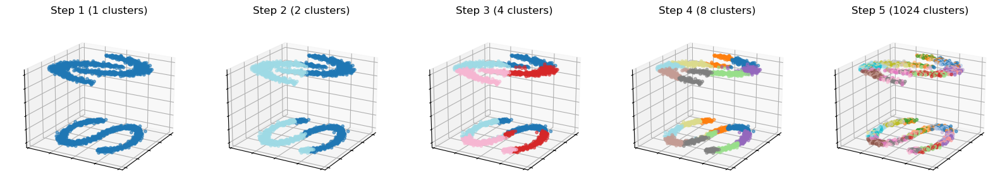

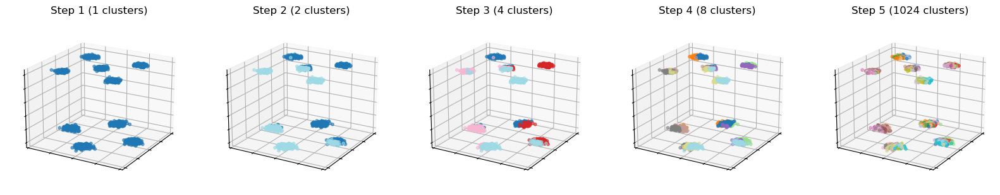

In [7]:
rank_schedule = [2, 2, 2, 128]
mapping_moons, partitions_moons_scurve = hierarchical_refinement(X_moons_3d, Y_s_curve_3d, rank_schedule, soft_clustering, return_partitions=True)
mapping_checkerboard, partitions_chk_3d = hierarchical_refinement(X_chk_3d, Y_chk_3d, rank_schedule, soft_clustering, return_partitions=True)

plot_partitions_over_steps_3d(X_moons_3d, Y_s_curve_3d, partitions_moons_scurve, figsize_per_step=(4,9), cmap_name='tab20')
plot_partitions_over_steps_3d(X_chk_3d, Y_chk_3d, partitions_chk_3d, figsize_per_step=(4,9), cmap_name='tab20')

The 3D visualization shows the data evolving from a single cluster to 2, 4, 8 and finally 1024 one‐to‐one matches, just as in the paper’s schematic.

In [8]:
# Plot the transport mapping for the half-moon/S-curve dataset
display(animate_transport_rotation(X_moons_3d, Y_s_curve_3d, mapping_moons,
    elev=30, azim_start=0, azim_end=360, frames=45, interval=250, figsize=(6,6)))

# Plot the transport mapping for the checkerboard dataset
display(animate_transport_rotation(X_chk_3d, Y_chk_3d, mapping_checkerboard,
    elev=30, azim_start=0, azim_end=360, frames=45, interval=250, figsize=(6,6)))

HiRef faithfully reproduces the intended multiscale co‐clustering and recovers the full Monge map.